In [1]:
import numpy as np
import os
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.regularizers import l1
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as keras

import matplotlib.pyplot as plt
import pandas as pd
from keras.utils.vis_utils import plot_model

from PIL import Image, ImageOps

import torch

from keras import models

import scipy.io

# from dfply import *

torch.manual_seed(4460)
np.random.seed(4460)

Using TensorFlow backend.


In [2]:
import tensorflow as tf
print("Num CPUs Available: ", len(tf.config.experimental.list_physical_devices('CPU')))
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num CPUs Available:  1
Num GPUs Available:  1


In [3]:
config = tf.compat.v1.ConfigProto(device_count = {'GPU': 1 , 'CPU': 1}) 
sess = tf.compat.v1.Session(config=config)
tf.compat.v1.keras.backend.set_session(sess)

In [4]:
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

# import data

In [5]:
xtrain_old = scipy.io.loadmat('./data/xtrain.mat')
xtrain_new = scipy.io.loadmat('./data/xtrain_new.mat')

ytrain_old = scipy.io.loadmat('./data/ytrain.mat')
ytrain_new = scipy.io.loadmat('./data/ytrain_new.mat')

In [6]:
# xtrain = scipy.io.loadmat('./data/xtrain_new.mat')
# ytrain = scipy.io.loadmat('./data/ytrain_new.mat')

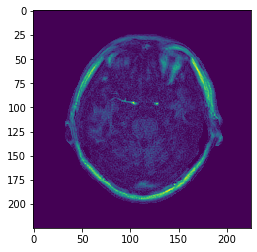

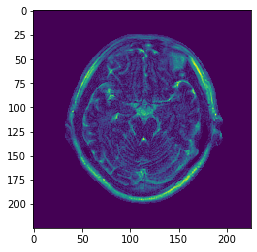

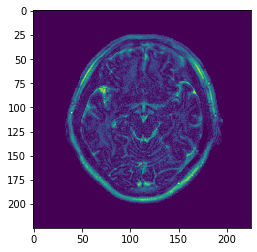

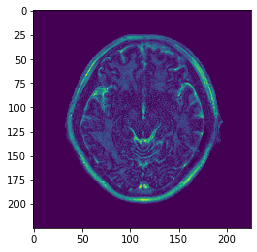

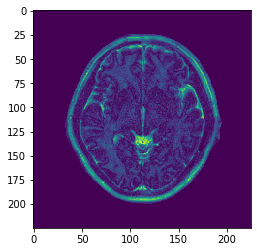

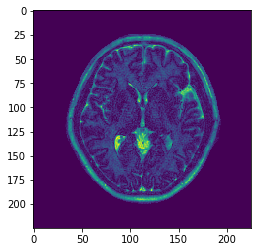

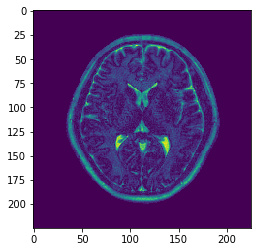

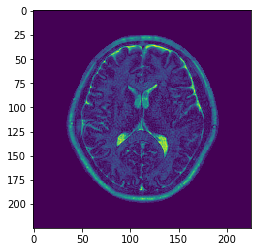

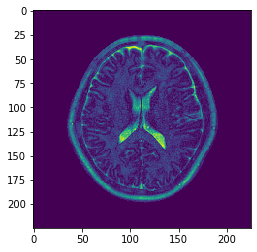

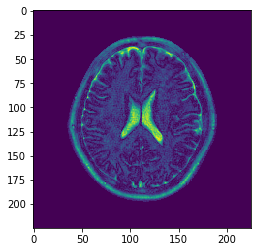

In [7]:
for i in range(10):
    plt.imshow(xtrain_new['nTMRF'][i])
    plt.show()

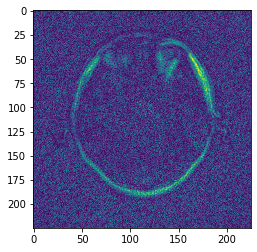

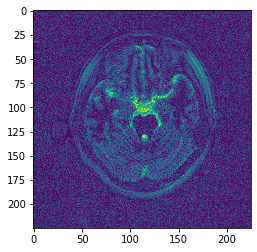

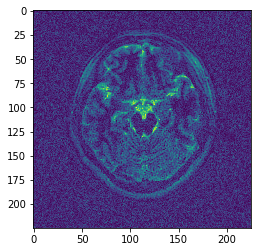

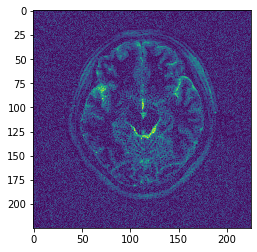

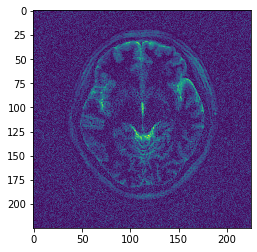

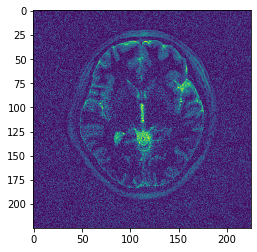

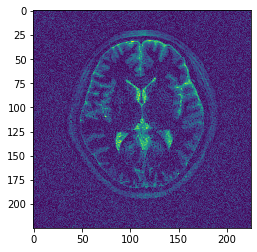

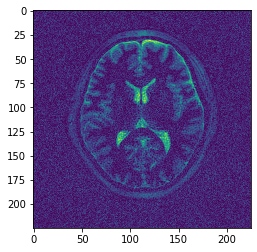

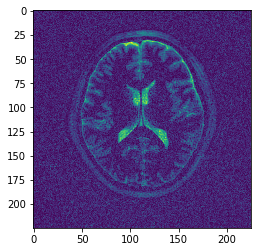

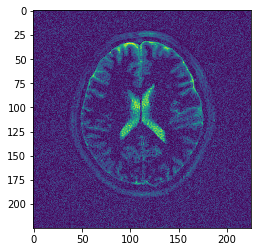

In [8]:
for i in range(10):
    plt.imshow(xtrain_old['TMRF_T2'][i])
    plt.show()

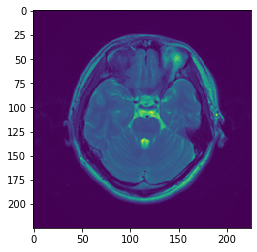

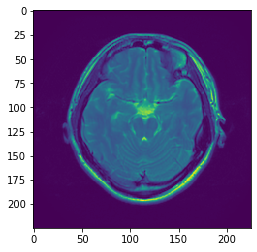

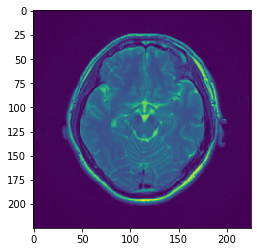

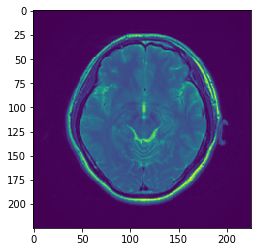

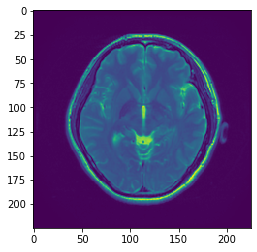

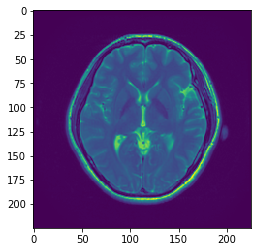

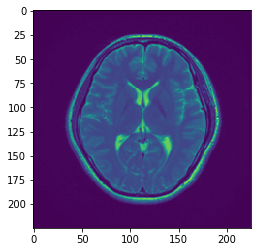

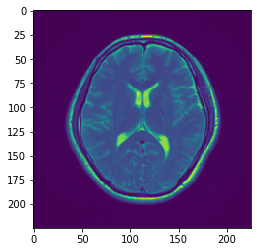

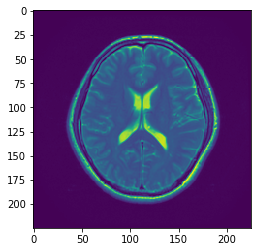

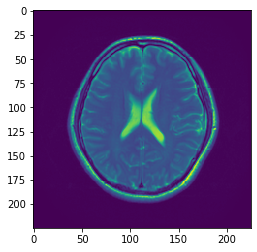

In [9]:
for i in range(10):
    plt.imshow(ytrain_new["GS"][i])
    plt.show()

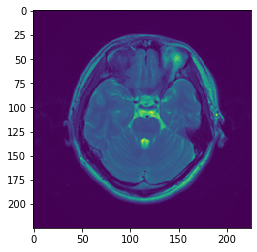

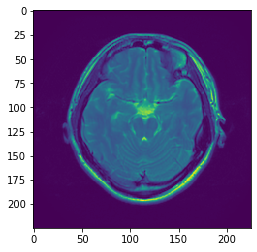

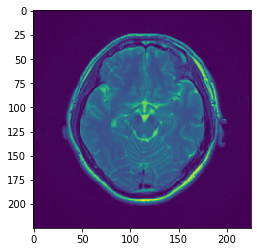

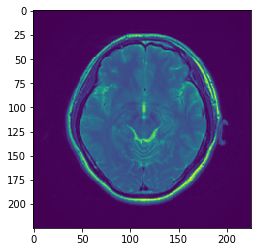

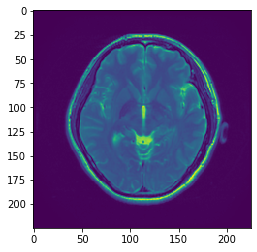

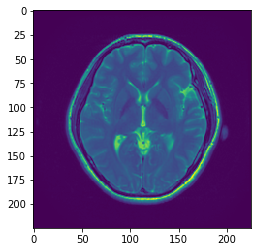

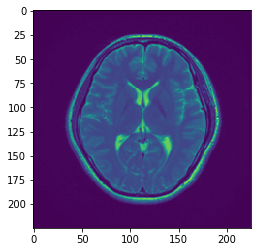

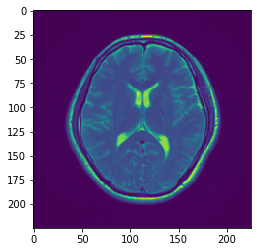

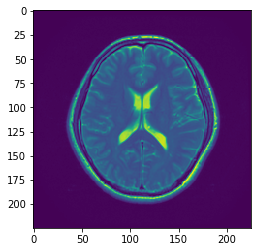

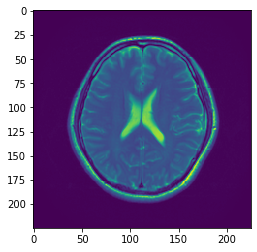

In [10]:
for i in range(10):
    plt.imshow(ytrain_new["GS"][i])
    plt.show()

# data preparation

In [11]:
# prepare data
old_xtrain_data = xtrain_old['TMRF_T2'][:, 0:224, 0:224]
new_xtrain_data = xtrain_new['nTMRF'][:, 0:224, 0:224]

xtrain = np.concatenate((new_xtrain_data, old_xtrain_data), axis = 0)


old_ytrain_data = ytrain_old['GS_T2'][:, 0:224, 0:224]
new_ytrain_data = ytrain_new['GS'][:, 0:224, 0:224]

ytrain = np.concatenate((new_ytrain_data, old_ytrain_data), axis = 0)






<function matplotlib.pyplot.imshow(X, cmap=None, norm=None, aspect=None, interpolation=None, alpha=None, vmin=None, vmax=None, origin=None, extent=None, shape=<deprecated parameter>, filternorm=1, filterrad=4.0, imlim=<deprecated parameter>, resample=None, url=None, *, data=None, **kwargs)>

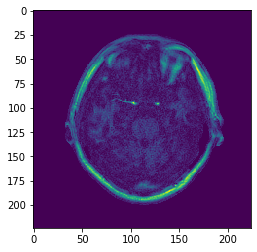

In [12]:
plt.imshow(xtrain[0])
plt.imshow

<function matplotlib.pyplot.imshow(X, cmap=None, norm=None, aspect=None, interpolation=None, alpha=None, vmin=None, vmax=None, origin=None, extent=None, shape=<deprecated parameter>, filternorm=1, filterrad=4.0, imlim=<deprecated parameter>, resample=None, url=None, *, data=None, **kwargs)>

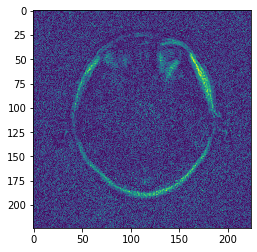

In [13]:
plt.imshow(xtrain[20])
plt.imshow

In [14]:
xtrain = np.reshape(xtrain, [40, 224, 224, 1])
ytrain = np.reshape(ytrain, [40, 224, 224, 1])
xval = xtrain[36:]
yval = ytrain[36:]

xtrain = xtrain[:36]
ytrain = ytrain[:36]

print(len(xtrain))
print(len(xval))

36
4


# model training

In [15]:
# Define from keras

def unet(pretrained_weights=None, input_size=(224, 224, 1)):
    inputs = Input(input_size)
    # conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    # conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
    # pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(1024, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)
    drop5 = Dropout(0.5)(conv5)

    up6 = Conv2D(512, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
        UpSampling2D(size=(2, 2))(drop5))
    merge6 = concatenate([drop4, up6], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)

    up7 = Conv2D(256, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
        UpSampling2D(size=(2, 2))(conv6))
    merge7 = concatenate([conv3, up7], axis=3)
    # conv7 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge7)
    # conv7 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)

    conv7 = Conv2D(256, 1, activation='relu', padding='same', kernel_initializer='he_normal')(merge7)
    conv7 = Conv2D(256, 1, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)

    # up8 = Conv2D(128, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
    #     UpSampling2D(size=(2, 2))(conv7))

    # up8 = Conv2D(128, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
    #     UpSampling2D(size=(2, 2))(conv7))
    up8 = Conv2D(128, 1, activation='relu', padding='same', kernel_initializer='he_normal')(
        UpSampling2D(size=(2, 2))(conv7))
    merge8 = concatenate([conv2, up8], axis=3)

    # conv8 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge8)
    conv8 = Conv2D(128, 1, activation='relu', padding='same', kernel_initializer='he_normal')(merge8)
    # conv8 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv8)
    conv8 = Conv2D(128, 1, activation='relu', padding='same', kernel_initializer='he_normal')(conv8)

    # up9 = Conv2D(64, 2, activation='relu', padding='same', kernel_initializer='he_normal')(
    #     UpSampling2D(size=(2, 2))(conv8))
    # merge9 = concatenate([conv1, up9], axis=3)
    # conv9 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge9)
    # conv9 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv9)
    # conv9 = Conv2D(2, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv8)


    # conv10 = Conv2D(1, 1, kernel_regularizer=l1(0.0001))(conv8)
    conv10 = Conv2D(1, 1)(conv8)

    model = Model(input=inputs, output=conv10)
    model.compile(optimizer=Adam(lr=1e-4), loss='mse',  metrics=['mae', 'mse'])
    print(model.summary())

    if (pretrained_weights):
        model.load_weights(pretrained_weights)

    return model

In [18]:
from keras.callbacks import EarlyStopping

# Define paths
checkpoint_path = "./saved_models/unet.hdf5"


# Define model hyperparameters
EPOCHS = 500
SPEREPOCH = 20


# Setup definitions for display
def plot_history(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Abs Error')
    plt.plot(hist['epoch'], hist['loss'],
             label='Train Error')
    plt.plot(hist['epoch'], hist['mae'],
             label='Val Error')
    plt.ylim([0, 500])
    plt.legend()
    plt.show()


model = unet()

# plot_model(model, to_file='model_plot.png')

# model_checkpoint = ModelCheckpoint('unet_pepa.hdf5', monitor='loss',verbose=1, save_best_only=True)
# cp_callback =  ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,verbose=1,save_best_only=True)
# cp_callback = ModelCheckpoint(filepath=checkpoint_path, save_weights_only=True, verbose=1)

# cp_callback = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_best_only=False,
#                               save_weights_only=True, mode='auto', period=1)

cp_callback = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_best_only=False,
                              save_weights_only=True, mode='auto', period=10)

#es = EarlyStopping(monitor='val_loss', mode='min', baseline=0.4)

callbacks_list = [cp_callback]
history = model.fit(
    xtrain, ytrain, validation_data = (xval,yval),
    #steps_per_epoch=SPEREPOCH,
    epochs=EPOCHS, callbacks=callbacks_list, verbose=1, batch_size=10)
print('Training done')

/home/wq2151/.conda/envs/BMEN4460/lib/python3.7/site-packages/ipykernel_launcher.py:63: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("co...)`


Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 224, 224, 1)  0                                            
__________________________________________________________________________________________________
conv2d_37 (Conv2D)              (None, 224, 224, 128 1280        input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_38 (Conv2D)              (None, 224, 224, 128 147584      conv2d_37[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_7 (MaxPooling2D)  (None, 112, 112, 128 0           conv2d_38[0][0]                  
____________________________________________________________________________________________

# save history

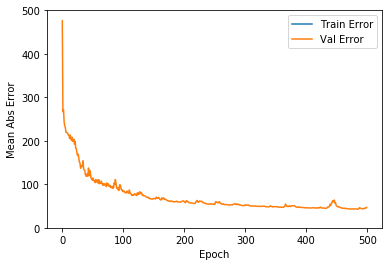

In [20]:
history_save = {'loss': history.history['loss'], 'mae': history.history['mae'], 'mse': history.history['mse']}
scipy.io.savemat('./history_invcor.mat', history_save)
plot_history(history)

In [22]:
# # VISUALIZATION
# plot_model(model, to_file='model_plot_invcor.png', show_shapes=True, show_layer_names=True)
# # layer_outputs = [layer.output for layer in model.layers[:1]]
# layer_outputs = [layer.output for layer in model.layers]

# activation_model = models.Model(inputs=model.input,
#                                 outputs=layer_outputs)  # Creates a model that will return these outputs, given the model input
# activations = activation_model.predict(xtest_vis)

# first_layer_activation = activations[29]
# print(first_layer_activation.shape)
# plt.matshow(first_layer_activation[0, :, :, 0], cmap='viridis')
# plt.show()

# dictOfactivations = {'Layer'+str(i): activations[i] for i in range(0, len(activations))}
# sio.savemat('./Lactivations_invcor.mat', dictOfactivations)

# # TESTING
# ypred = model.predict(xtrain, verbose=1)
# result = {'ypred_invcor': ypred, 'ytrain_deblur': ytrain}
# sio.savemat('./TMRF_128_invcor.mat', result)

In [23]:
# TESTING
ypred = model.predict(xtrain, verbose=1)
result = {'ypred_invcor': ypred, 'ytrain_deblur': ytrain, 'xtrain': xtrain}
scipy.io.savemat('./TMRF_128_invcor_Apr15.mat', result)

36/36 [==============================] - 15s 425ms/step


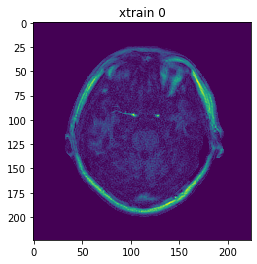

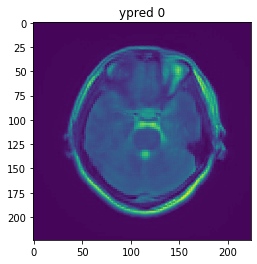

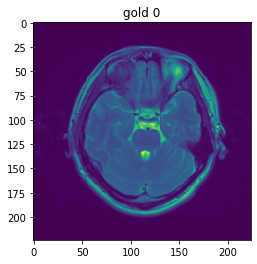

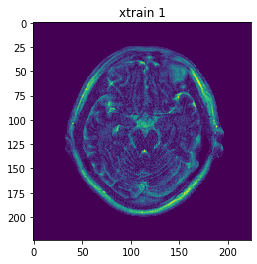

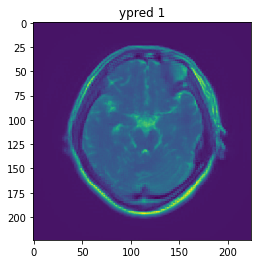

...

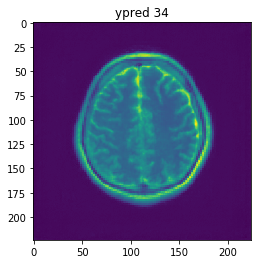

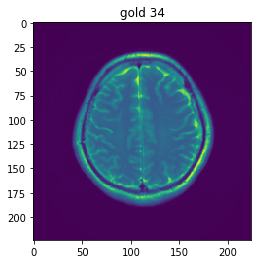

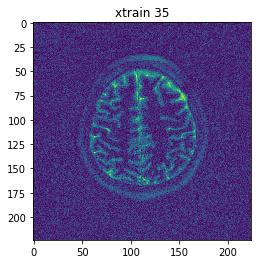

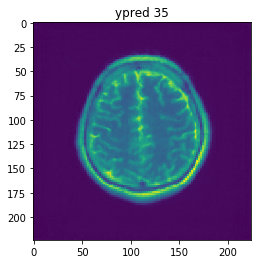

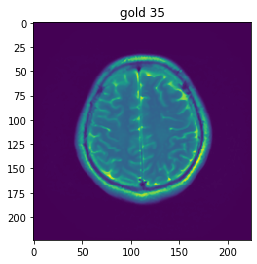

In [25]:
for i in range(36):
    plt.imshow(result['xtrain'][i,:,:,0])
    plt.title('xtrain '+str(i))
    plt.show()
    plt.imshow(result['ypred_invcor'][i,:,:,0]) 
    plt.title('ypred '+str(i))
    plt.show()
    plt.imshow(result['ytrain_deblur'][i,:,:,0])  
    plt.title('gold '+str(i))
    plt.show()